In [2]:

import random

import numpy as np
import matplotlib.pyplot as plt
import math
import random
import operator
import torch
import copy
import time



[[0.0052, 0.1206], [0.0496, 0.1218], [0.0712, 0.1224], [0.0761, 0.1225], [0.1008, 0.1232], [0.1267, 0.1239], [0.1368, 0.1241], [0.1368, 0.1241], [0.1391, 0.1242], [0.1621, 0.1248], [0.1666, 0.125], [0.1745, 0.1252], [0.199, 0.1259], [0.2053, 0.126], [0.2073, 0.1261], [0.209, 0.1261], [0.2138, 0.1263], [0.2168, 0.1264], [0.2347, 0.1269], [0.2484, 0.1272], [0.2841, 0.1283], [0.2892, 0.1284], [0.3024, 0.1288], [0.3115, 0.129], [0.3165, 0.1292], [0.3353, 0.1297], [0.3992, 0.1316], [0.4028, 0.1317], [0.4604, 0.1335], [0.4795, 0.134], [0.4843, 0.1342], [0.5393, 0.1359], [0.54, 0.1359], [0.5552, 0.1364], [0.5608, 0.1366], [0.5857, 0.1374], [0.5963, 0.1377], [0.5966, 0.1377], [0.6018, 0.1379], [0.7162, 0.1416], [0.7359, 0.1423], [0.7458, 0.1426], [0.7576, 0.143], [0.7596, 0.1431], [0.7823, 0.1438], [0.7939, 0.1442], [0.8018, 0.1445], [0.8037, 0.1446], [0.8039, 0.1446], [0.8572, 0.1464], [0.8934, 0.1477], [0.9161, 0.1485], [0.9305, 0.149], [0.9449, 0.1495], [0.9791, 0.1508], [0.9842, 0.1509], [

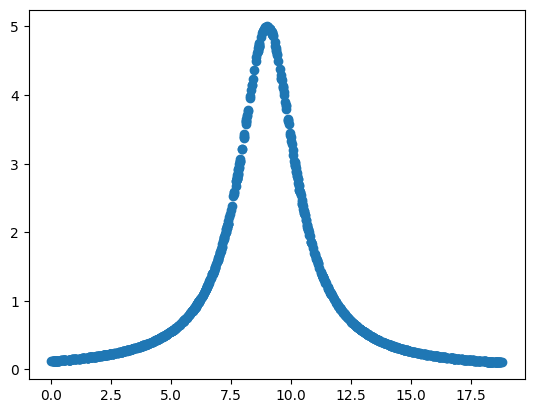

In [3]:



file = open('D:\python\data2022_Silver.txt','r')#data - Half  #data2022_Silver
data = file.readlines()

data_inpack = []
for cord in data:
  cord_split = cord.replace('\n','').split(',')
  data_inpack.append([float(cord_split[0]),float(cord_split[1])])

print(data_inpack)

#plotting the data
x_axis = []
y_axis = []
for i in range(len(data_inpack)):
  x_axis.append(data_inpack[i][0])
  y_axis.append(data_inpack[i][1])

plt.scatter(x_axis,y_axis)

#Binary Tree Structure

In [4]:
#general useage variables
operator1 = ['+','-','*',"/"]
operator2 = ['+','-','*',"/"]
operator3 = []
termial = []
pool = []
for i in range(12):
  termial.append(random.uniform(-10,10))
for i in range(5):
  termial.append("x")

pool = termial+operator1+operator1

print(pool)


[-5.572451173119733, 4.418733786516846, -9.968846719286084, -2.9780121345546213, -3.7114981521675583, 8.930044436615603, 5.173888668887759, 5.082413788292579, 3.5791251834535114, 7.566088459304119, -8.873993551639073, 4.912660213627067, 'x', 'x', 'x', 'x', 'x', '+', '-', '*', '/', '+', '-', '*', '/']


In [5]:
def dynamic_pool(operator1):
  termial = []
  for i in range(6):
    termial.append(random.uniform(-10,10))
  for i in range(6):
    termial.append("x")

  pool = termial+operator1
  return pool,termial

In [6]:
# def intelligent_assigner():

def intelligent_assigner(layer,operator1,operator2,operator3,pool,termial):
  
  st1 = [[0,operator1[random.randint(0,len(operator1)-1)]],[1,pool[random.randint(0,len(pool)-1)]],[2,pool[random.randint(0,len(pool)-1)]]]
  


  for q in range(1,layer): #layer operation
    for e in range(2**q-1,2**q-1+(2**q-1)+1): #all legit indexs on that layer
      if q != layer-1:

        for w in range(len(st1)):#loop through whole list to find those match certain layer index
          if st1[w][0] == e:
            for r in range(len(operator2)): 
            
              
              if st1[w][1] == operator2[r]:
                #grow 2
                st1.append([2*e+1,pool[random.randint(0,len(pool)-1)]])
                st1.append([2*e+2,pool[random.randint(0,len(pool)-1)]])
                
            for r in range(len(operator3)):
              
              if st1[w][1] == operator3[r]:
              #grow 1
                st1.append([2*e+1,pool[random.randint(0,len(pool)-1)]])

 ##########################    
      if q == layer-1:
        for w in range(len(st1)):#loop through whole list to find those match certain layer index
          if st1[w][0] == e:
            for r in range(len(operator2)): 
            
              
              if st1[w][1] == operator2[r]:
                #grow 2
                st1.append([2*e+1,termial[random.randint(0,len(termial)-1)]])
                st1.append([2*e+2,termial[random.randint(0,len(termial)-1)]])
                
            for r in range(len(operator3)):
              
              if st1[w][1] == operator3[r]:
              #grow 1
                st1.append([2*e+1,termial[random.randint(0,len(termial)-1)]])        
  return st1


In [6]:
print(intelligent_assigner(5,operator1,operator2,operator3,pool,termial))


[[0, '*'], [1, '/'], [2, '/'], [3, 'x'], [4, 'x'], [5, '-'], [6, '/'], [11, 3.886733642356033], [12, 8.614733771941406], [13, 0.565008115254999], [14, 'x']]


In [7]:

#NEO - CALCULATION


def calculate3(storage,q):

  final_list = []
  buffer = 1
  divisionzero = 0
  indexlist = []
  for t in range(len(storage)):
    indexlist.append(storage[t][0])
  
  for i in range(len(storage)):
    if storage[i][1] == "x":
      storage[i][1] = q
    
  
  for i in range(len(storage)):
    a = len(storage)-i-1
    if storage[a][1] == "+":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]+storage[target2][1])

    if storage[a][1] == "-":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]-storage[target2][1])

    if storage[a][1] == "*":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]*storage[target2][1])

    if storage[a][1] == "/":
      try:
        target1 = indexlist.index(storage[a][0]*2+1)
        target2 = indexlist.index(storage[a][0]*2+2)
        storage[a][1] = float(storage[target1][1]/storage[target2][1])
      except:
        divisionzero = 1
        break

    if storage[a][1] == "sin":
      
      target1 = indexlist.index(storage[a][0]*2+1)
      
      storage[a][1] = float(math.sin(storage[target1][1]))

    if storage[a][1] == "cos":
      
      target1 = indexlist.index(storage[a][0]*2+1)
      storage[a][1] = float(math.cos(storage[target1][1]))

  if divisionzero == 1:
    storage[0][1] = 100000000
  
      


  return(storage[0][1])


In [8]:
#mean square eror
def error(real,est):
  errortotal = 0
  for i in range(len(real)):
    error = (abs(real[i]-est[i]))**2
    errortotal = errortotal+error
  errortotal = errortotal/len(real)
  return errortotal

In [55]:
#run
x_axis=[]
y_axis=[]

layer = 5
buffer = []
errorset1 = []
final_exp1 = []
evaluation_xaxis1 = []

finaltotal = 0
for i in range(len(data_inpack)):  #unpack real x and y
  x_axis.append(data_inpack[i][0])
  y_axis.append(data_inpack[i][1])

for p in range(30000):
  evaluation_xaxis1.append(p)
  buffer = dynamic_pool(operator1)
  pool = buffer[0]
  termial = buffer[1]
  n = intelligent_assigner(layer,operator1,operator2,operator3,pool,termial)
  est = []
  for j in range(len(x_axis)):  
    est.append(calculate3(copy.deepcopy(n), float(x_axis[j])))
  totalerror1 = error(y_axis,est)
  if p == 0:
    finaltotal1 = totalerror1
  if finaltotal1 > totalerror1:
    mathfinal1 = []
    mathfinal1.append(est)
    final_exp1 = []
    final_exp1.append(n)
    finaltotal1 = totalerror1
    errorset1.append(totalerror1)
  else:
    errorset1.append(finaltotal1)
  print(errorset1[-1])

30.85188621527763
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.632846986400001
1.63284698

In [56]:
with open('RANDOM1_error.txt', 'a') as f:
    for i in range(len(errorset1)):
      f.write(str(errorset1[i]))
      f.write('\n')

[-0.907558896307553, 0.25915247197995545, 0.10963457088673272, 0.8512096415753643, -0.8998506652039594, 0.031731369281636036, 0.5849745926993871, 0.5849745926993871, 0.6802463464865052, 0.9756034215226732, 0.92388080169339, 0.7821187573626872, 0.16599880880332027, 0.00595408590865705, -0.04312352342448829, -0.08405702039407933, -0.19533925020172846, -0.2613917062786295, -0.5931026548593235, -0.7733339841852919, -0.9895950186270491, -0.9970238437395524, -0.996219869457006, -0.9815076805590922, -0.9693416712371258, -0.9031402385756265, -0.556144102964675, -0.5346561621589645, -0.2020914180509111, -0.10108347899178585, -0.07663191899316295, 0.17532205735986142, 0.17819357121088034, 0.23852379141309502, 0.25978996709528107, 0.348309877564603, 0.3831133427706406, 0.384074218471085, 0.40052201884685734, 0.676307837200081, 0.709997487227179, 0.7256923601252101, 0.7433853529996651, 0.7462787525870509, 0.7770938143832363, 0.7914821562337803, 0.8007889144905552, 0.80296973874157, 0.8031980224062

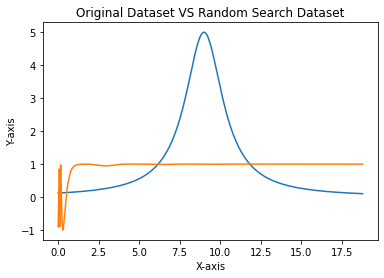

In [ ]:
#plotting
print(mathfinal1[0])
plt.plot(x_axis,y_axis)
plt.plot(x_axis,mathfinal1[0])
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Original Dataset VS Random Search Dataset")
# print(math_expression_final)
print(finaltotal1)


0.18210699898429175 0.5321323822052172


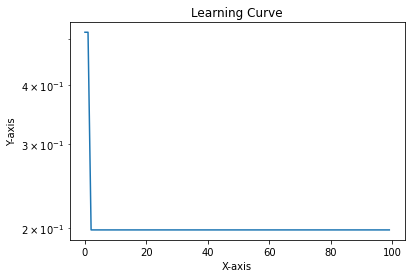

In [ ]:
#learning curve
plt.plot(evaluation_xaxis1,errorset1)
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Learning Curve")
# print(math_expression_final)
# Rewrite the y labels
bottom,top = plt.ylim()
plt.yscale("log")

print(bottom,top)

#Hill Climbing Method

In [9]:

#NEO - CALCULATION


def calculate_mutation(storage,q):

  final_list = []
  buffer = 1
  divisionzero = 0
  indexlist = []
  

  for t in range(len(storage)):
    indexlist.append(storage[t][0])
  
  for i in range(len(storage)):
    godswill1 = random.random()
    if "x" in str(storage[i][1]):
      x = q
      storage[i][1] = eval(storage[i][1])

    
  
  for i in range(len(storage)):
    a = len(storage)-i-1
    if storage[a][1] == "+":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]+storage[target2][1])

    if storage[a][1] == "-":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]-storage[target2][1])

    if storage[a][1] == "*":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]*storage[target2][1])

    if storage[a][1] == "/":
      try:
        target1 = indexlist.index(storage[a][0]*2+1)
        target2 = indexlist.index(storage[a][0]*2+2)
        storage[a][1] = float(storage[target1][1]/storage[target2][1])
      except:
        divisionzero = 1
        break

    if storage[a][1] == "sin":
      
      target1 = indexlist.index(storage[a][0]*2+1)
      
      storage[a][1] = float(math.sin(storage[target1][1]))

    if storage[a][1] == "cos":
      
      target1 = indexlist.index(storage[a][0]*2+1)
      storage[a][1] = float(math.cos(storage[target1][1]))

  if divisionzero == 1:
    storage[0][1] = 100000000
  
      


  return(storage[0][1])

In [10]:
#mutation by changing constants or insert small factors
def mutation(exp):
  number =[]
  x = []
  operator = []
  asdf = 1
  godswill = random.random()
  for i in range(len(exp)):
    if type(exp[i][1]) == float:
      number.append(i)
    if exp[i][1] == 'x':
      x.append(i)    
    if exp[i][1] == 'sin'or exp[i][1] == 'cos':
      operator.append(i)
 
  if godswill>0.5: #changing constsants
    try:
      z = number[random.randint(0,len(number)-1)]
      exp[z][1] = exp[z][1]+(random.random()-0.5)
    except:
      # print("no numbers in it")
      asdf = 1
  if godswill<0.5:#changing operators
    try:
      v1 = operator[random.randint(0,len(operator)-1)]
    
      if exp[v1][1] == 'sin':
        exp[v1][1] ='cos'
      else:
        exp[v1][1] ='sin'
    except:
      # print("no sin/cos in it")
      asdf = 1
  if godswill<1:# x ooperation
    try:
      ed = x[random.randint(0,len(x)-1)]
      exp[ed][1] = operator[random.randint(0,len(operator)-1)]
     
      exp[ed][1] = str(random.uniform(0.9,1.1))+'*x'
  
    except:
      #print("no x in it")
      asdf = 1


  return exp

In [14]:
a = mutation([[0, '-'], [1, 7.614779590314178], [2, 'x'], [5, 'cos'], [6, '+'], [13, 7.614779590314178],[14, 'x']])
print(a)

[[0, '-'], [1, 7.614779590314178], [2, '1.0247036839729764*x'], [5, 'cos'], [6, '+'], [13, 7.545203030672691], [14, 'x']]


In [ ]:
random.randint(0,0)

0

In [ ]:
#run
x_axis=[]
y_axis=[]
est_final = []
layer = 6
buffer = []
errorset2 = []
final_exp2 = []
evaluation_xaxis2 = []
finaltotal2 = 0

for i in range(len(data_inpack)):  #unpack real x and y
  x_axis.append(data_inpack[i][0])
  y_axis.append(data_inpack[i][1])

for p in range(50):
  
  buffer = dynamic_pool(operator1)
  pool = buffer[0]
  termial = buffer[1]
  n = intelligent_assigner(layer,operator1,operator2,operator3,pool,termial)
  for w in range(10):
    evaluation_xaxis2.append(p)
    n = mutation(n)
    est = []
    for j in range(len(x_axis)):  
      est.append(calculate_mutation(copy.deepcopy(n), float(x_axis[j])))
    totalerror2 = error(y_axis,est)
    if p == 0 and w == 0:
      finaltotal2 = totalerror2
    if finaltotal2 > totalerror2:
      mathfinal2 = []
      mathfinal2.append(est)
      print(mathfinal2)
      final_exp2 = []
      final_exp2.append(n)
      finaltotal2 = totalerror2
      errorset2.append(totalerror2)
    else:
      errorset2.append(finaltotal2)


[[0, 'sin'], [1, -2.624475549861588], [2, '1.0938368110441612*x']]
0.19769980643721646


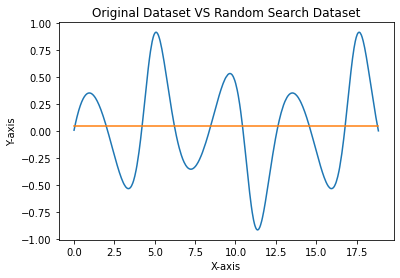

In [ ]:
#plotting
#print(mathfinal2[0])
print(final_exp2[0])
plt.plot(x_axis,y_axis)
plt.plot(x_axis,mathfinal2[0])
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Original Dataset VS Random Search Dataset")
# print(math_expression_final)
print(finaltotal2)

0.16556594532131325 0.8725108898711841


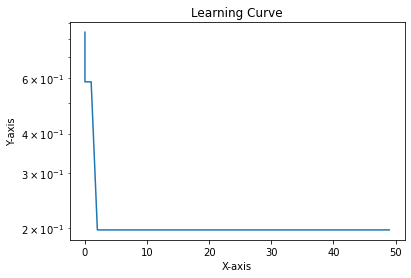

In [ ]:
#learning curve
plt.plot(evaluation_xaxis2,errorset2)
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Learning Curve")
# print(math_expression_final)
# Rewrite the y labels
bottom,top = plt.ylim()
plt.yscale("log")

print(bottom,top)

In [ ]:
for i in range(0,0):
  print(yes)

#EA

In [11]:
# Im gonna make things right this time

def crossover_newborn1(parent1,parent2,layer):

  max_layer = layer+2
  parent1_index = []
  parent2_index = [] 
  buffer_p1 = copy.deepcopy(parent1)
   
  branch = []
  for i in range(len(parent1)):
    parent1_index.append(parent1[i][0])

  for i in range(len(parent2)):
    parent2_index.append(parent2[i][0])
  
  index_p1 = copy.deepcopy(parent1_index)

  index_inter = list(set(parent1_index).intersection(parent2_index))

  # chosen = index_inter[random.randint(0,len(index_inter)-1)]
  chosen = 0
  #print(chosen)
  #print(parent1_index)
  for q in range(layer+1): #layer
    for w in range(2**q): #in-layer
      for p in range(len(buffer_p1)): #comparsion
        #print((chosen+1)*(2**(q))-1+w)
        #print("indexloop",index_p1)
        if ((chosen+1)*(2**(q))-1+w) == index_p1[p]:
          #base
          #print((chosen+1)*(2**(q))-1+w)
          #print(index_p1[p])
          parent1.remove(buffer_p1[p])
          #print(parent1)
  
      for p in range(len(parent2)):
        if ((chosen+1)*(2**(q))-1+w) == parent2_index[p]:
          #branch
          branch.append(parent2[p])

  beauty_child = parent1+branch
  
  beauty_child.sort(key=lambda beauty_child: beauty_child[0])
  return beauty_child

        


  #input a index and find all subtrees


In [12]:
a = crossover_newborn1([[0, 'cos'], [1, 0.9455518335113098], [2, '-'], [5, '+'], [6, -0.939296013900135], [11, 'x'], [12, 2.0812947337021175]],[[0, '*'], [1, '*'], [2, 9.005313144194055], [3, 'x'], [4, 'cos'], [9, 'x']],5)
print(a)


[[0, '*'], [1, '*'], [2, 9.005313144194055], [3, 'x'], [4, 'cos'], [9, 'x']]


In [13]:
#mutation by changing constants or insert small factors
def mutation(exp):
  number =[]
  x = []
  operator = []
  asdf = 1
  godswill = random.random()
  for i in range(len(exp)):
    if type(exp[i][1]) == float:
      number.append(i)
    if exp[i][1] == 'x':
      x.append(i)    
    if exp[i][1] == 'sin'or exp[i][1] == 'cos':
      operator.append(i)
 
  if godswill>0.1: #changing constsants
    try:
      z = number[random.randint(0,len(number)-1)]
      exp[z][1] = exp[z][1]+(5*random.random()-2.5)
    except:
      # print("no numbers in it")
      asdf = 1
  if godswill>0.5:#changing operators
    try:
      v1 = operator[random.randint(0,len(operator)-1)]
    
      if exp[v1][1] == 'sin':
        exp[v1][1] ='cos'
      else:
        exp[v1][1] ='sin'
    except:
      # print("no sin/cos in it")
      asdf = 1
  if godswill<1:# x ooperation
    try:
      ed = x[random.randint(0,len(x)-1)]
      exp[ed][1] = operator[random.randint(0,len(operator)-1)]
     
      exp[ed][1] = str(random.uniform(0.9,1.1))+'*x'
  
    except:
      #print("no x in it")
      asdf = 1


  return exp

In [14]:
# crossover

def crossover_newbon(parent1,parent2,layer):
  genehead1 = parent1[random.randint(1,len(parent1)-1)]
  genehead2 = parent2[random.randint(1,len(parent2)-1)]
  layer = layer-1
  max_layer = layer+4
  def treefinder_base(pick,geneset,layer): #keep the treebase

    complete_tree = []
    index_geneset = []
    base_tree = []
    complete_tree.append(pick)
    
    for i in range(len(geneset)):
      index_geneset.append(geneset[i][0])
      index_target = pick[0]

    
    
    for q in range(layer):
      for w in range(2**(q+1)):
        for p in range(len(index_geneset)):
          #print((index_target+1)*(2**(q+1))-1+w)
          if ((index_target+1)*(2**(q+1))-1+w) == index_geneset[p]:
            complete_tree.append(geneset[p])
    # print("The base tree taken out:",complete_tree)
    for i in range(len(geneset)):
      indicator = 0
      for w in range(len(complete_tree)):
        if complete_tree[w] == geneset[i]:
          indicator = 1
      if indicator != 1:
        base_tree.append(geneset[i])
    # print("The base tree is:",base_tree)
    return base_tree



  # def sortlist(storage):
  #   storage.sort(key=lambda storage: storage[0])
  #   return storage 



  def treefinder_branch(pick,picknew,geneset,layer): #get the branch out and redefine the index

    complete_tree = []
    complete_tree1 = []
    index_geneset = []
    
    # print(pick)
    for i in range(len(geneset)):
      index_geneset.append(geneset[i][0])
      index_target = pick[0]

    index_redefine = picknew[0]
    
    pick[0] = picknew[0]
    complete_tree.append(pick)
    for q in range(layer):
      for w in range(2**(q+1)):
        for p in range(len(index_geneset)):
          #print((index_target+1)*(2**(q+1))-1+w)
          
          if ((index_target+1)*(2**(q+1))-1+w) == index_geneset[p]:
            complete_tree1.append(geneset[p])
            geneset[p][0] = (index_redefine+1)*(2**(q+1))-1+w
            complete_tree.append(geneset[p])
    # print("The brach that needs to be inserted is(before changing index)",complete_tree1)
    # print("The brach that needs to be inserted is",complete_tree)
    return complete_tree

  def sortlist(storage):
    storage.sort(key=lambda storage: storage[0])
    return storage 

  

  tree1_base = treefinder_base(genehead1,parent1,layer) #base
  tree2_branch = treefinder_branch(genehead2,genehead1,parent2,layer) #add
  beauty_child = tree1_base+tree2_branch
  beauty_child = sortlist(beauty_child)
  if beauty_child[-1][0]>(2*max_layer-1)*2:
    #u went too far bitch!
    beauty_child = mutation(parent1)

  return beauty_child
  


        


  #input a index and find all subtrees



In [15]:

#NEO - CALCULATION


def calculate_mutation(storage,q):

  final_list = []
  buffer = 1
  divisionzero = 0
  indexlist = []
  

  for t in range(len(storage)):
    indexlist.append(storage[t][0])
  
  for i in range(len(storage)):
    godswill1 = random.random()
    if "x" in str(storage[i][1]):
      x = q
      storage[i][1] = eval(storage[i][1])

    
  
  for i in range(len(storage)):
    a = len(storage)-i-1
    if storage[a][1] == "+":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]+storage[target2][1])

    if storage[a][1] == "-":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]-storage[target2][1])

    if storage[a][1] == "*":
      target1 = indexlist.index(storage[a][0]*2+1)
      target2 = indexlist.index(storage[a][0]*2+2)
      storage[a][1] = float(storage[target1][1]*storage[target2][1])

    if storage[a][1] == "/":
      try:
        target1 = indexlist.index(storage[a][0]*2+1)
        target2 = indexlist.index(storage[a][0]*2+2)
        storage[a][1] = float(storage[target1][1]/storage[target2][1])
      except:
        divisionzero = 1
        break

    if storage[a][1] == "sin":
      
      target1 = indexlist.index(storage[a][0]*2+1)
      
      storage[a][1] = float(math.sin(storage[target1][1]))

    if storage[a][1] == "cos":
      
      target1 = indexlist.index(storage[a][0]*2+1)
      storage[a][1] = float(math.cos(storage[target1][1]))

  if divisionzero == 1:
    storage[0][1] = 100000000
  
      


  return(storage[0][1])

In [16]:
#mutation by changing constants or insert small factors
def mutation_devil(exp):
  number =[]
  x = []
  operator = []
  asdf = 1
  operatorr = ['+','-','*','/']
  godswill = random.random()
  for i in range(len(exp)):
    if type(exp[i][1]) == float:
      number.append(i)
    if exp[i][1] == 'x':
      x.append(i)    
    if exp[i][1] == '+' or exp[i][1] == '-' or exp[i][1] == '*' or exp[i][1] == '/':
      operator.append(i)
  
  if godswill<0.5: #changing constsants
    try:
      z = number[random.randint(0,len(number)-1)]
      exp[z][1] = exp[z][1]+(5*random.random()-2.5)
    except:
      # print("no numbers in it")
      asdf = 1
  # if godswill>0.01:#changing operators
  #   try:
  #     v1 = operator[random.randint(0,len(operator)-1)]
    
  #     if exp[v1][1] == 'sin':
  #       exp[v1][1] ='cos'
  #     else:
  #       exp[v1][1] ='sin'
  #   except:
  #     # print("no sin/cos in it")
  #     asdf = 1
  if godswill>0.7:#changing operators
    try:
      v1 = operator[random.randint(0,len(operator)-1)]
    
      
      exp[v1][1] = operatorr[random.randint(0,len(operatorr)-1)]

    except:
      # print("no sin/cos in it")
      asdf = 1

  if godswill<1:# x ooperation
    try:
      ed = x[random.randint(0,len(x)-1)]
     
      exp[ed][1] = str(random.uniform(0.9,1.1))+'*x'
  
    except:
      #print("no x in it")
      asdf = 1


  return exp

In [17]:
elite_arena = []
elite_arena1 = []
elite_arena2 = []
totalerror_elite = []
totalerror_elite1 = []
totalerror_elite2 = []
index_parent = []
age_arena_initial = [] #initial age 0 population
parentpopulation = 50  #important
childpoulation = 20
layer = 5
#evaluation_xaxis1 = []
for initialpop in range(parentpopulation): #create 50 parents
  #evaluation_xaxis1.append(initialpop)
  buffer = dynamic_pool(operator1)
  pool = buffer[0]
  termial = buffer[1]
  
  elite_arena1.append(intelligent_assigner(layer,operator1,operator2,operator3,pool,termial))
  est = []
  for j in range(len(x_axis)):  
    est.append(calculate_mutation(copy.deepcopy(elite_arena1[initialpop]), float(x_axis[j]))) #cal
  totalerror_elite1.append(error(y_axis,est))
  index_parent.append(initialpop)

for childpop in range(childpoulation): #children generation

  a = random.sample(index_parent,2)
  elite_arena2.append(crossover_newbon(copy.deepcopy(elite_arena1[a[0]]),copy.deepcopy(elite_arena1[a[1]]),layer))
  est = []
  for j in range(len(x_axis)):  
    est.append(calculate_mutation(copy.deepcopy(elite_arena2[childpop]), float(x_axis[j]))) #cal
  totalerror_elite2.append(error(y_axis,est))

totalerror_elite = totalerror_elite1+totalerror_elite2
elite_arena = elite_arena1+elite_arena2

for i in range(parentpopulation):
  age_arena_initial.append(0)



for i in range(childpoulation):
  age_arena_initial.append(1)

pack_elite = list(zip(totalerror_elite,elite_arena,age_arena_initial))

#pack_elite.sort(reverse=False,key=lambda pack_elite: pack_elite[2])
print(pack_elite)

#evolution                sort only for truncating

################################################################################################
errorrecord = []
bestrecord = []

for totaleva in range(50000):
  age_newguy = []
  elite_arena1 = []
  totalerror_elite1 = []
  totalerror_elite3 = []
  elite_arena3 = []
  totalerror_elite_pool = []
  elite_arena_pool = []
  age_arena_pool = []
  newchild_index = []
  bufferrr = []
  st = time.time()
  #pack_elite = pack_elite[:int(len(pack_elite)/2)]    remember to select
  
  pack_elite.sort(reverse=False,key=lambda pack_elite: pack_elite[2])
  for qw in range(len(pack_elite)):
    totalerror_elite_pool.append(pack_elite[qw][0])
    elite_arena_pool.append(pack_elite[qw][1])
    age_arena_pool.append(pack_elite[qw][2])
  


  if totaleva !=0:
    for childpop in range(50): #children generation through first gen
      
      max_indi = max(age_arena_pool)
      
      a = random.randint(0,len(pack_elite)-1) #careful for index_parent
      try:
        b = random.randint(int(a-len(pack_elite)/3),int(a+len(pack_elite)/3))
        bufferrr = elite_arena_pool[b]
      except:
        try:
          b = random.randint(int(a-len(pack_elite)/3),int(len(pack_elite)-1))
          bufferrr = elite_arena_pool[b]
        except:
          b = random.randint(0,int(a+len(pack_elite)/3))
          bufferrr = elite_arena_pool[b]




      elite_arena3.append(crossover_newbon(copy.deepcopy(elite_arena_pool[a]),copy.deepcopy(bufferrr),layer))
      est = []
      #print(elite_arena3[childpop])

      for j in range(len(x_axis)):  
        est.append(calculate_mutation(copy.deepcopy(elite_arena3[childpop]), float(x_axis[j]))) #cal
      #et = time.time()
      #print(et-st)
      totalerror_elite3.append(error(y_axis,est))
      #add index
      newchild_index.append(max(age_arena_pool[a],age_arena_pool[b])+1)




  if totaleva != 0 and totaleva%10 == 0:
    for popagain in range(70): # 10,20,30,40 supply 50 new guys
      buffer = dynamic_pool(operator1)
      pool = buffer[0]
      termial = buffer[1]
      
      elite_arena1.append(intelligent_assigner(layer,operator1,operator2,operator3,pool,termial))
      est = []
      for j in range(len(x_axis)):  
        est.append(calculate_mutation(copy.deepcopy(elite_arena1[popagain]), float(x_axis[j]))) #cal
      totalerror_elite1.append(error(y_axis,est))
      #index_parent.append(popagain)
      age_newguy.append(0)




  totalerror_elite = totalerror_elite_pool+totalerror_elite3+totalerror_elite1
  elite_arena = elite_arena_pool+elite_arena3+elite_arena1
  totalindex = age_arena_pool+newchild_index+age_newguy

  
  pack_elite = list(zip(totalerror_elite,elite_arena,totalindex))
  print(totaleva)
  pack_elite.sort(reverse=False,key=lambda pack_elite: pack_elite[0])
  print("before",len(pack_elite))
  if totaleva == 0 or (totaleva+1)%10 == 0: # 0,9,19,29 kill only top 50 left
    index_AAA = []
    junior = []
    mid_level = []
    senior = []
    for i in range(len(pack_elite)):
      index_AAA.append(pack_elite[i][2])
    max_indi = max(index_AAA)
    for q in range(len(pack_elite)):
      if 0<=index_AAA[q]<max_indi/3:
        junior.append(pack_elite[q])
      if max_indi/3<=index_AAA[q]<max_indi/3*2:
        mid_level.append(pack_elite[q])        
      if max_indi/3*2<=index_AAA[q]<=max_indi:
        senior.append(pack_elite[q])
    junior.sort(reverse=False,key=lambda junior: junior[0])
    junior = junior[:int(len(junior)/2)]
    mid_level.sort(reverse=False,key=lambda mid_level: mid_level[0])
    mid_level = mid_level[:int(len(mid_level)/2)]
    senior.sort(reverse=False,key=lambda senior: senior[0])   
    senior = senior[:int(len(senior)/2)]
    pack_elite = junior+mid_level+senior
    pack_elite.sort(reverse=False,key=lambda pack_elite: pack_elite[0])
    pack_elite1 = []
    pack_elite1.append(pack_elite[0])
    for i in range(1,len(pack_elite)):
      
      if pack_elite[i][1] != pack_elite[0][1]:
        pack_elite1.append(pack_elite[i])
    pack_elite = pack_elite1
    bestrecord.append(pack_elite[0])


  errorrecord.append(pack_elite[0][0])
  bestrecord.append(pack_elite[0])



  et = time.time()
  print(et-st)
  print(pack_elite[0])
#ujson.loads(ujson.dumps

[(56.402429578801694, [[0, '-'], [1, 5.270746443969035], [2, 'x']], 0), (130.56163939903377, [[0, '+'], [1, 'x'], [2, 1.629280101502328]], 0), (5.810130981550319, [[0, '/'], [1, 'x'], [2, '*'], [5, 6.360372472398215], [6, '/'], [13, 'x'], [14, -6.488667320721959]], 0), (2.680463386400003, [[0, '*'], [1, '-'], [2, -9.106304816890592], [3, 'x'], [4, 'x']], 0), (255.56465075704503, [[0, '/'], [1, 'x'], [2, '/'], [5, 7.463937596900124], [6, '-'], [13, 'x'], [14, 3.404721551410523]], 0), (14.526773044238672, [[0, '-'], [1, 'x'], [2, '-'], [5, 'x'], [6, -2.5670820640189262]], 0), (40.399428437688485, [[0, '-'], [1, 'x'], [2, 5.40759946056345]], 0), (100.87548647602011, [[0, '/'], [1, '*'], [2, -8.652399926160195], [3, 'x'], [4, -8.652399926160195]], 0), (74.90532913448105, [[0, '*'], [1, '+'], [2, '/'], [3, -1.9491956573974143], [4, -5.586963956704942], [5, 'x'], [6, 'x']], 0), (200.12145620109413, [[0, '+'], [1, 4.668321942566331], [2, 'x']], 0), (9691.26133616454, [[0, '*'], [1, 'x'], [2, 

In [53]:
with open('1022_bestset.txt', 'a') as f:
    for i in range(len(bestrecord)):
      f.write(str(bestrecord[i]))
      f.write('\n')
      

Text(0.5, 1.0, 'Original Dataset VS GA-ALPS Estimate')

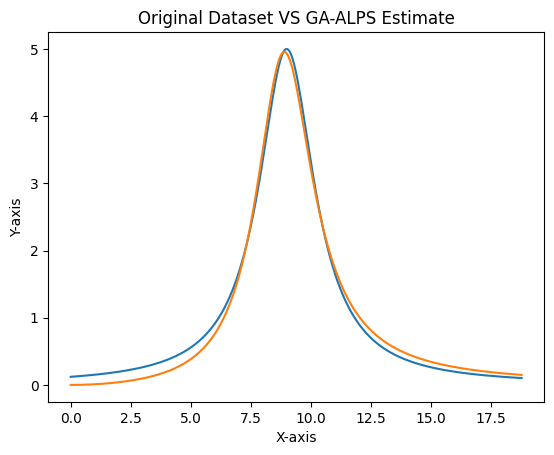

In [54]:
est = []
for j in range(len(x_axis)):  
  est.append(calculate_mutation(([[0, '/'], [1, 1.7683391657375136], [2, '+'], [5, '/'], [6, '/'], [11, '/'], [12, '/'], [13, '+'], [14, '/'], [23, 12.212462426055124], [24, 'x'], [25, 'x'], [26, 15.078678071086262], [27, 'x'], [28, -11.550140600605587], [29, 11.984868287832853], [30, 'x']]),x_axis[j]))
totalerror_elite3.append(error(y_axis,est))

    #plotting
#print(mathfinal1[0])
plt.plot(x_axis,y_axis)
plt.plot(x_axis,est)
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Original Dataset VS GA-ALPS Estimate")
# print(math_expression_final)
#print(finaltotal1)


In [ ]:
a = [1,2,3,4,5,6]
a= a[:3]
print(a)

[1, 2, 3]


In [ ]:
print(elite_arena2[childpop])
print(elite_arena1[a[0]])
print(elite_arena1[a[1]])

[[0, '/'], [1, 'x'], [2, '*'], [2, 'x']]
[[0, '/'], [1, 'x'], [2, '*'], [1, 'x'], [2, 'x']]
[[0, '*'], [1, 'x'], [2, '+'], [5, '+'], [6, -6.623180309838153], [11, -3.0315800473692622], [1, 'x']]


In [ ]:
a = []
a = random.sample(index_parent,2)
print(a)

[36, 42]


In [ ]:
q = crossover_newbon([[0, '+'], [1, '/'], [2, 'x'], [3, 'x'], [4, '-'], [9, '-'], [10, 8.77193214179539], [19, -1.7941709588253048], [20, '*'], [41, 'x'], [42, 'x']],[[0, '+'], [1, '/'], [2, 'x'], [3, 'x'], [4, '-'], [9, '-'], [10, 8.77193214179539], [19, -1.7941709588253048], [20, '*'], [41, 'x'], [42, 'x']],5)
print(q)

[[0, '+'], [1, '/'], [2, 'x'], [3, 'x'], [4, '-'], [9, '-'], [10, 8.77193214179539], [19, -1.7941709588253048], [20, '*'], [41, 'x'], [42, 'x']]
[0, 1, 2, 3, 4, 9, 10, 19, 20, 41, 42]
start 0
[[0, '+'], [1, '/'], [2, 'x'], [3, 'x'], [4, '-'], [9, '-'], [10, 8.77193214179539], [19, -1.7941709588253048], [20, '*'], [41, 'x'], [42, 'x']]
[0, 1, 2, 3, 4, 9, 10, 19, 20, 41, 42]
start 19
[[19, -1.7941709588253048]]
